In [25]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('../')


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random 
import scipy
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from torch.utils.data import DataLoader, TensorDataset,ConcatDataset
from scipy.stats import zscore

from sklearn.neighbors import KDTree
from coral import coral_main, VisCoxDataset, utils, utils_exp, utils_simu
from scipy.spatial import cKDTree

import scanpy as sc
import anndata
import torch

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [26]:
meta_info = pd.read_csv("groundtruth_metadata.csv")
counts_data = pd.read_csv("simulated_counts.csv", index_col=0)


# Load ground truth for cell types (if needed)
#cell_types = pd.read_csv("groundtruth_celltypes.csv")
codex_adata = anndata.AnnData(counts_data.transpose().loc[:,[i.split('_')[0]=='ADT' for i in counts_data.transpose().columns]])
codex_adata.obs['x'] = meta_info.X
codex_adata.obs['y'] = meta_info.Y
codex_adata.obs['label'] = meta_info.label.values
codex_adata.obs['cell_type'] = meta_info.cell_type.values
codex_adata.obsm['spatial'] = np.array(meta_info[['X','Y']])

visium_adata = anndata.AnnData(counts_data.transpose().loc[:,[i.split('_')[0]!='ADT' for i in counts_data.transpose().columns]])
visium_adata.obs['x'] = meta_info.X
visium_adata.obs['y'] = meta_info.Y
visium_adata.obs['label'] = meta_info.label.values
visium_adata.obs['cell_type'] = meta_info.cell_type.values
visium_adata.obsm['spatial'] = np.array(meta_info[['X','Y']])

adata = codex_adata

12
1
10
7
5
2
17
6
4
15
13
14
18
9
19


(-12.710103438409885,
 306.92990840681836,
 -9.30269021476914,
 214.01338071429356)

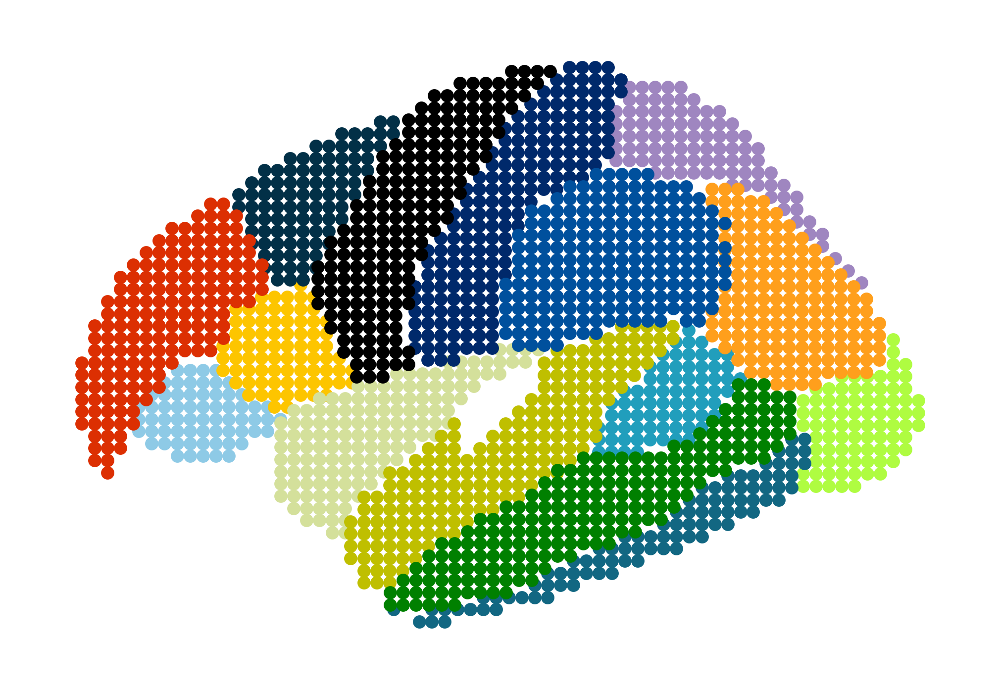

In [28]:
color_list = [
'#8ecae6',
'#219ebc',                                        
'#fdc500',
#
'#affc41', 
'#126782',
'#023047',
'#9f86c0',                                   
'#d4e09b',
'#ff9f1c',
'#dc2f02',
'#00296b',  
'k',
    'y',
    'g',
    '#00509d',   
]

fig, ax = plt.subplots(1,1,figsize=(3,2),dpi=800)
for j,i in enumerate(adata.obs['label'].unique()):
    print(i)
    plt.scatter(adata.obsm['spatial'][adata.obs['label']==i,0],
                adata.obsm['spatial'][adata.obs['label']==i,1],
                s=2,
                color = color_list[j]
               )
#plt.legend(adata.obs['label'].unique(),bbox_to_anchor=(1.01,0.8))
plt.axis('off') 
#plt.gca().invert_yaxis()

Memory CD4 T
CD14+ Mono
Naive CD4 T
NK
Mouse
B
CD8 T
CD16+ Mono
T/Mono doublets
CD34+
Multiplets
Eryth
Mk
DC
pDCs


(-12.710103438409885,
 306.92990840681836,
 -9.30269021476914,
 214.01338071429356)

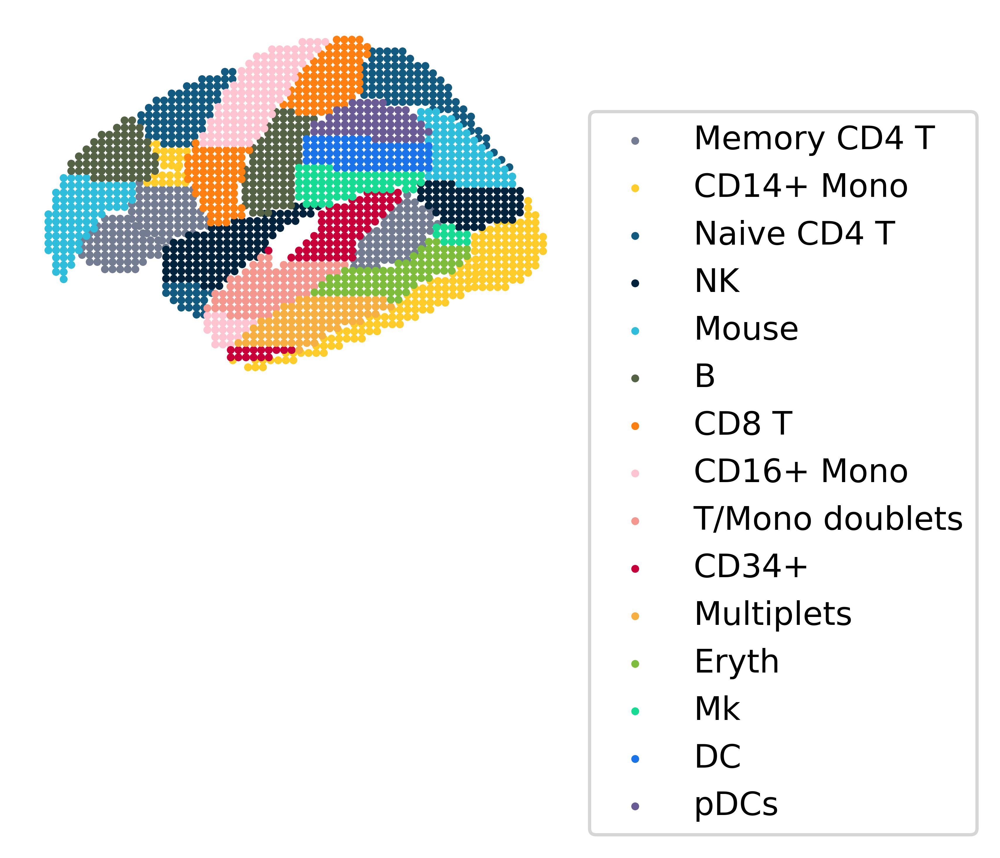

In [29]:
color_list = [
    '#747C92',  # Light Blue
    '#ffcc29',  # Bright Yellow
    '#125a80',  # Deep Teal
    '#02233b',  # Dark Navy
    '#2ebedc',  # Bright Cyan
    '#566246',  # Fresh Green
    '#ff7f11',  # Vibrant Orange
    '#FFC4D1',  # Dark Crimson
    '#f4978e',  # Soft Coral
    '#c70039',  # Vivid Red
    '#f6b042',  # Golden Yellow
    '#7ebd3c',  # Spring Green
    '#16db93',  # Aquamarine Green
    '#1a73e8',  # Bold Blue
    '#6b5b95',  # Dusty Purple
    '#3f3d56'   # Charcoal Gray
]

fig, ax = plt.subplots(1,1,figsize=(3,2),dpi=800)
for j,i in enumerate(adata.obs['cell_type'].unique()):
    print(i)
    plt.scatter(adata.obsm['spatial'][adata.obs['cell_type']==i,0],
                adata.obsm['spatial'][adata.obs['cell_type']==i,1],
                s=2,
                color = color_list[j]
               )
plt.legend(adata.obs['cell_type'].unique(),bbox_to_anchor=(1.01,0.8))
plt.axis('off') 
#plt.gca().invert_yaxis()

Memory CD4 T
CD14+ Mono
Naive CD4 T
NK
Mouse
B
CD8 T
CD16+ Mono
T/Mono doublets
CD34+
Multiplets
Eryth
Mk
DC
pDCs


(-12.710103438409885,
 306.92990840681836,
 -9.30269021476914,
 214.01338071429356)

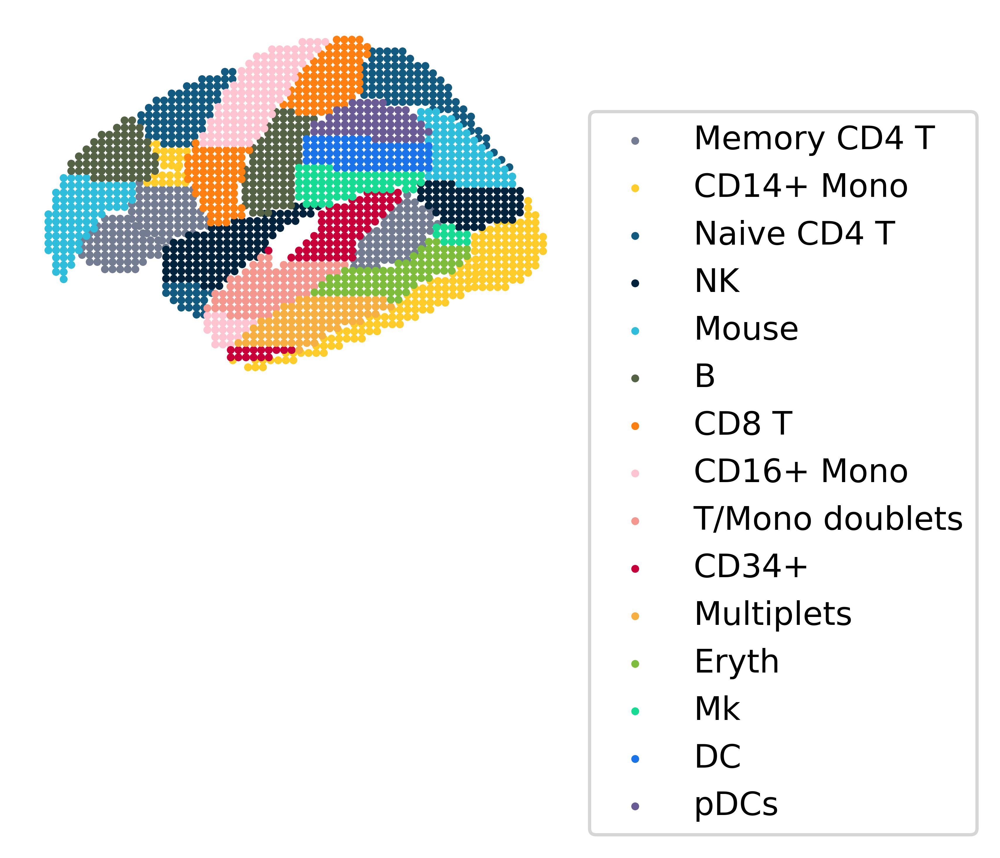

In [30]:
color_list = [
    '#747C92',  # Light Blue
    '#ffcc29',  # Bright Yellow
    '#125a80',  # Deep Teal
    '#02233b',  # Dark Navy
    '#2ebedc',  # Bright Cyan
    '#566246',  # Fresh Green
    '#ff7f11',  # Vibrant Orange
    '#FFC4D1',  # Dark Crimson
    '#f4978e',  # Soft Coral
    '#c70039',  # Vivid Red
    '#f6b042',  # Golden Yellow
    '#7ebd3c',  # Spring Green
    '#16db93',  # Aquamarine Green
    '#1a73e8',  # Bold Blue
    '#6b5b95',  # Dusty Purple
    '#3f3d56'   # Charcoal Gray
]

fig, ax = plt.subplots(1,1,figsize=(3,2),dpi=800)
for j,i in enumerate(adata.obs['cell_type'].unique()):
    print(i)
    plt.scatter(adata.obsm['spatial'][adata.obs['cell_type']==i,0],
                adata.obsm['spatial'][adata.obs['cell_type']==i,1],
                s=2,
                color = color_list[j]
               )
plt.legend(adata.obs['cell_type'].unique(),bbox_to_anchor=(1.01,0.8))
plt.axis('off') 
#plt.gca().invert_yaxis()

/hpc/mydata/siyu.he/Siyu_projects/Coral_project/notebooks/../coral/utils_simu.py:214: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_, resolution=res,random_state=42)


13
9
7
1
8
10
2
4
12
14
11
0
6
3
5


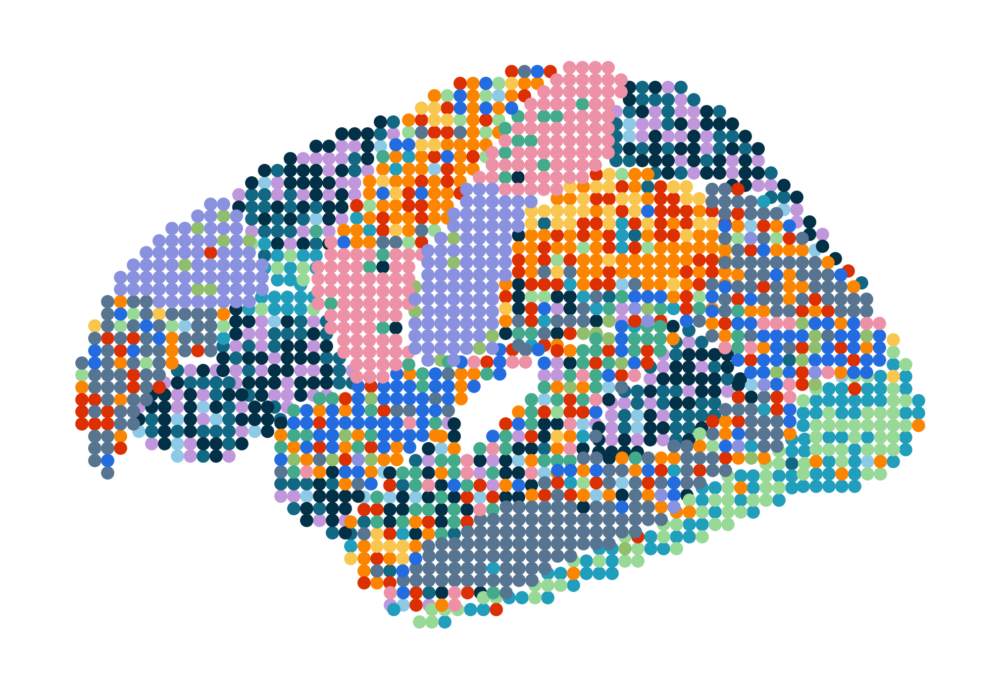

In [31]:
codex_adata_copy = utils_simu.plot_pca_cluster(codex_adata,
                                                res=1.18,
                                                size =2,
                                                color_list = [
                                                '#8ecae6',
'#c197db',
'#126782',
'#023047',
'#219ebc',                                   
'#98d998',
'#fb8500',
'#dc2f02',                         
'#f9c74f',
'#90be6d',
'#43aa8b',
'#577590',  
'#226CE0',
'#ed91a6',
'#8a91de'
                                                ],
                                                figsize=(3,2),
                                                legd = False,#True,
                                                invert_yaxis=False,                   
                                                return_ = True,
                                                axis_=False,
                                                ) 

14
4
2
3
7
9
12
11
10
1
0
5
8
6
13


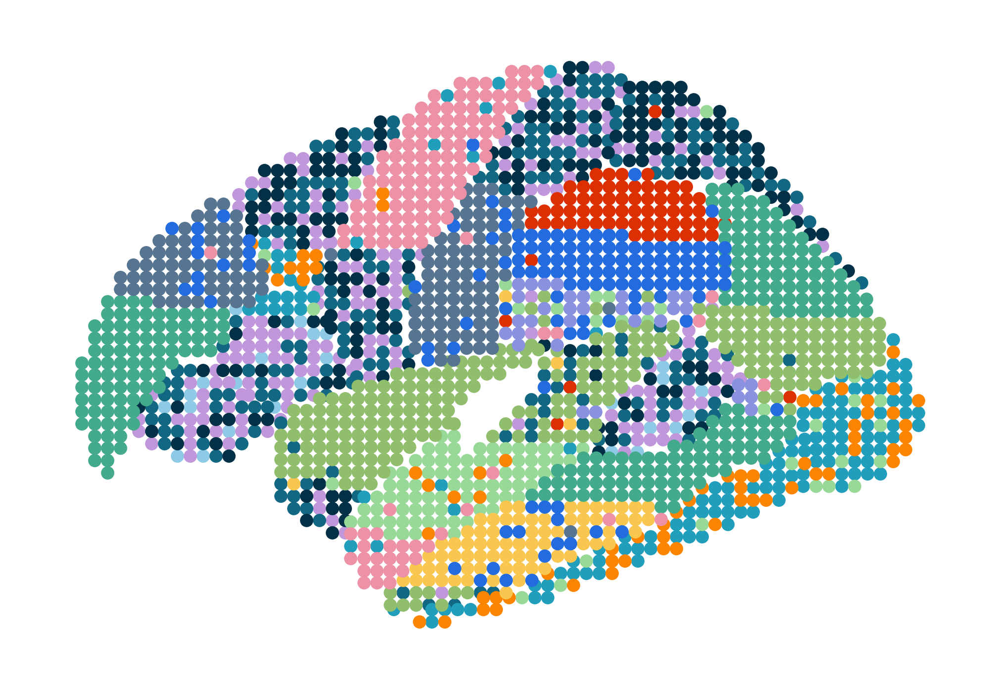

In [32]:
utils_simu.plot_pca_cluster(visium_adata,
                               res=2.35,
                               size =2,
                               color_list = ['#8ecae6',
'#c197db',
'#126782',
'#023047',
'#219ebc',                                   
'#98d998',
'#fb8500',
'#dc2f02',                         
'#f9c74f',
'#90be6d',
'#43aa8b',
'#577590',  
'#226CE0',
'#ed91a6',
'#8a91de'
                                ],
                            figsize=(3,2),
                            legd = False,#True,
                            invert_yaxis=False,   
                            return_ = True,
                            axis_=False,
                              )
visium_adata.obs['type'] = codex_adata_copy.obs['cluster'].copy()

In [33]:
visium_adata_copy = visium_adata.copy()
sc.pp.normalize_total(visium_adata_copy,target_sum=1e4)
sc.pp.log1p(visium_adata_copy)

In [34]:
visium_adata

AnnData object with n_obs × n_vars = 1992 × 106
    obs: 'x', 'y', 'label', 'cell_type', 'type'
    obsm: 'spatial'

In [37]:
visium_adata_r1

AnnData object with n_obs × n_vars = 943 × 106
    obsm: 'spatial'

In [38]:
1992/943

2.112407211028632

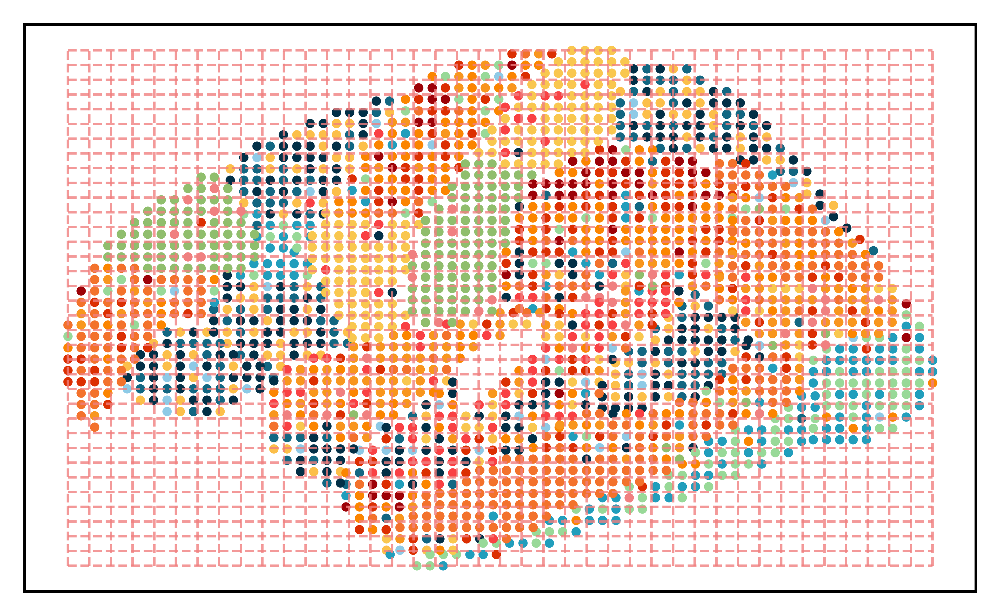

In [35]:
color_list = [
                                '#8ecae6',
                                '#fcbf49',
                                '#126782',
                                '#023047',
                                '#219ebc',                                   
                                '#98d998',

                                '#fb8500',
                                '#dc2f02',

                                '#9d0208',
                                '#f08080',
                                '#f94144',
                                '#f3722c',
                                '#f8961e',
                                '#f9c74f',
                                '#90be6d',
                                '#43aa8b',
                                '#577590',  
                                '#226CE0',
                                '#534B62'
                                ]
block_data, block_spatial = utils_simu.downsample_and_plot_spatial_data(visium_adata,
                                                                        color_list = color_list,
                                                             n_blocks_x=40, 
                                                             n_blocks_y=35,
                                                             size = 3,
                                                             figsize=(5,3),
                                                             invert_yaxis=False
                                                                       )
#block_data = block_data[:,0,:]
# Create a new AnnData object for the downsampled data
visium_adata_r1 = sc.AnnData(X=block_data)
visium_adata_r1.obsm['spatial'] = block_spatial

0
4
5
6
1
12
3
8
13
2
10
7
9
14
11


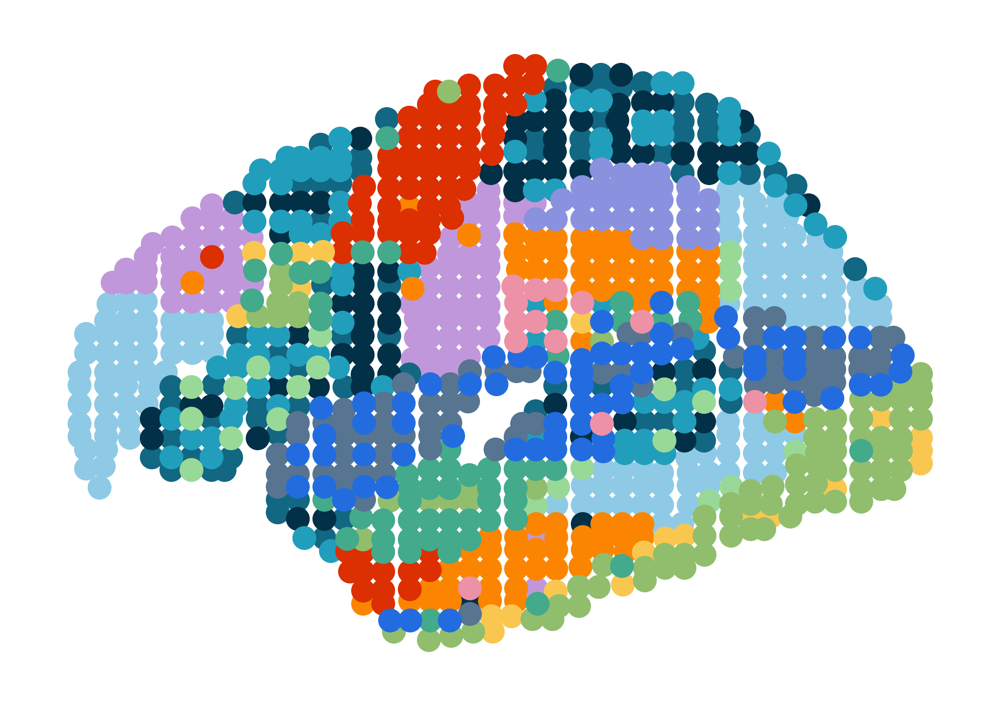

In [36]:
visium_adata_r1_cluster = utils_simu.plot_pca_cluster(visium_adata_r1,
                               res=2.5,
                               size =13,
                            color_list = [
'#8ecae6',
'#c197db',
'#126782',
'#023047',
'#219ebc',                                   
'#98d998',
'#fb8500',
'#dc2f02',                         
'#f9c74f',
'#90be6d',
'#43aa8b',
'#577590',  
'#226CE0',
'#ed91a6',
'#8a91de'
],
                                #legd = True,
                                return_ = True,
                                 figsize = (3.2,2.2),
                                axis_ = False,
                             invert_yaxis=False
                              )

(-12.710103438409885,
 306.92990840681836,
 -9.30269021476914,
 214.01338071429356)

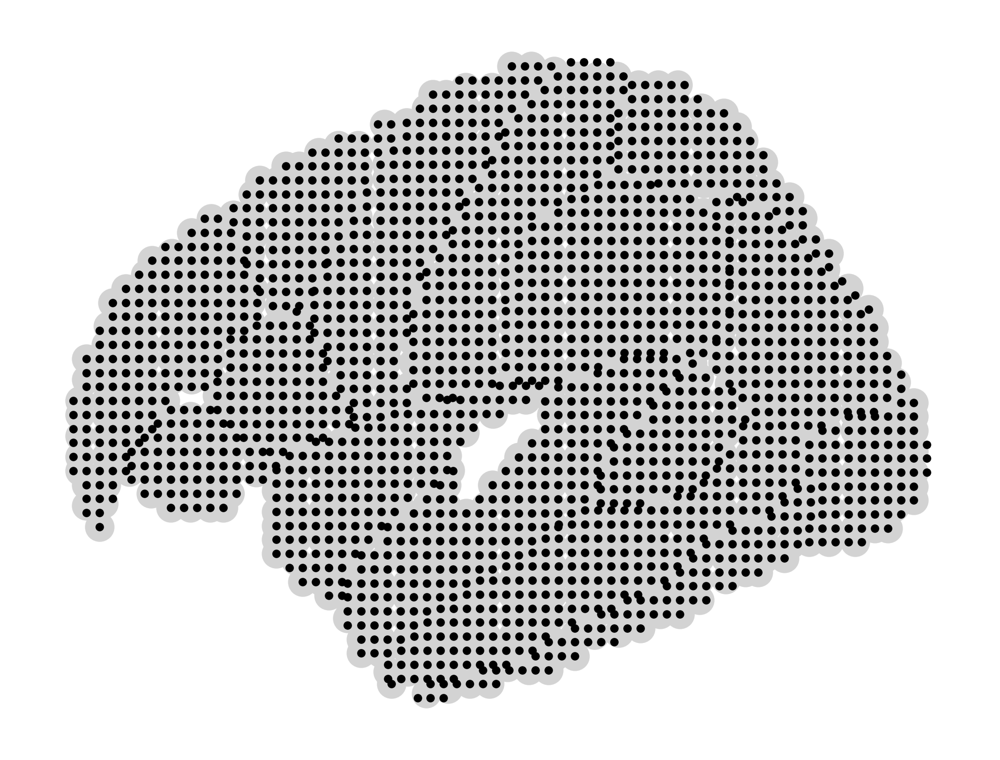

In [13]:
plt.figure(dpi=600,figsize=(4,3))
plt.scatter(visium_adata_r1.obsm['spatial'][:,0],
            visium_adata_r1.obsm['spatial'][:,1],
            c= 'lightgray'#visium_adata_r1.to_df().iloc[:,2]
           )

plt.scatter(codex_adata.obsm['spatial'][:,0],
            codex_adata.obsm['spatial'][:,1],
            s=1,
            c= 'k',#codex_adata.to_df().iloc[:,2]
           )
plt.axis('off')

In [14]:
codex_adata.X = codex_adata.X#.toarray()
combined_expr, codex_coords, one_hot_cell_types, spot_indices, visium_expr = utils.preprocess_data(visium_adata_r1, codex_adata)
    
dataloader = utils.prepare_local_subgraphs(combined_expr, codex_coords, one_hot_cell_types, 
                                           spot_indices, visium_expr,n_neighbors=20)    


/hpc/mydata/siyu.he/anaconda/2023.03/x86_64/envs/scvi_v1_env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


In [15]:
codex_adata.obs['cell_type'].unique()

array(['Memory CD4 T', 'CD14+ Mono', 'Naive CD4 T', 'NK', 'Mouse', 'B',
       'CD8 T', 'CD16+ Mono', 'T/Mono doublets', 'CD34+', 'Multiplets',
       'Eryth', 'Mk', 'DC', 'pDCs'], dtype=object)

In [16]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

if torch.cuda.is_available():
    print("GPU is available.")
    gpu_count = torch.cuda.device_count()
    print(f"Number of GPUs available: {gpu_count}")
    for i in range(gpu_count):
        print(f"GPU {i}: {torch.cuda.get_device_name(i)}")
else:
    print("GPU is not available.")
    

GPU is available.
Number of GPUs available: 1
GPU 0: NVIDIA A40


In [89]:
visium_adata_r1_cluster.write('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/fig3/visium_adata_r1.h5ad')
codex_adata_copy.write('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/fig3/codex_adata.h5ad')
visium_adata.write('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/fig3/visium_adata.h5ad')


In [17]:
model, optimizer = coral_main.create_model(visium_dim = visium_adata_r1.shape[1],
                                           codex_dim = codex_adata.shape[1],
                                           cell_type_dim=one_hot_cell_types.shape[1],
                                          
                                           latent_dim=32, 
                                           hidden_channels=128, 
                                           v_dim = 1
                                          )
model.to(device)


CORAL_model(
  (encoder_visium): Sequential(
    (0): Linear(in_features=121, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=64, bias=True)
  )
  (encoder_codex): Sequential(
    (0): Linear(in_features=6, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=64, bias=True)
  )
  (encoder): Sequential(
    (0): Linear(in_features=127, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=64, bias=True)
  )
  (zi_prior): Sequential(
    (0): Linear(in_features=16, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=64, bias=True)
  )
  (cross_attention): CrossAttentionLayer(
    (query_proj): Linear(in_features=32, out_features=32, bias=True)
    (key_proj): Linear(in_features=32, out_features=32, bias=True)
    (value_proj): Linear(in_features=32, out_features=32, bias=True)
    (softmax): Softmax(dim=-1)
  )
  (deconv): Deconvolut

In [18]:
coral_main.train_model(model, optimizer, dataloader, epochs = 100,device = device)


Epoch 0, Loss: 294945.265373996
Epoch 1, Loss: 252237.2768260542
Epoch 2, Loss: 247179.78498368475
Epoch 3, Loss: 243247.25511420684
Epoch 4, Loss: 231934.1236508534
Epoch 5, Loss: 228272.19910893575
Epoch 6, Loss: 232234.91183483935
Epoch 7, Loss: 230403.2612951807
Epoch 8, Loss: 226386.25069026105
Epoch 9, Loss: 228327.03677208835
Epoch 10, Loss: 222606.07241465864
Epoch 11, Loss: 219207.1518888052
Epoch 12, Loss: 220268.0361445783
Epoch 13, Loss: 220174.49438378515
Epoch 14, Loss: 222718.156375502
Epoch 15, Loss: 221463.6590110442
Epoch 16, Loss: 218534.0766189759
Epoch 17, Loss: 222895.61012801205
Epoch 18, Loss: 215056.3811809739
Epoch 19, Loss: 217089.8264620984
Epoch 20, Loss: 216144.97286019076
Epoch 21, Loss: 216569.5846197289
Epoch 22, Loss: 218716.80264809236
Epoch 23, Loss: 218704.4486696787
Epoch 24, Loss: 217404.9624121486
Epoch 25, Loss: 218171.23503388555
Epoch 26, Loss: 217743.3810554719
Epoch 27, Loss: 218756.12562751005
Epoch 28, Loss: 218384.4731425703
Epoch 29, Los

In [19]:
import torch

# Define the path where you want to save the model
model_save_path = "model_brain.pth"
optimizer_save_path = "optimizer_brain.pth"



In [20]:
# Save the model's state_dict
torch.save(model.state_dict(), model_save_path)
# Save the optimizer's state_dict
torch.save(optimizer.state_dict(), optimizer_save_path)


In [21]:
#model_save_path = "model.pth"
#optimizer_save_path = "optimizer.pth"

model.load_state_dict(torch.load(model_save_path))

# If you saved the optimizer as well, load it
optimizer.load_state_dict(torch.load(optimizer_save_path))

In [22]:
(generated_expr, 
 generated_protein,latent_rep, 
 locations,
 visium_true,
 codex_true, 
 attn_weights_all, 
 edges_all,
 v_values, 
 cell_types)= coral_main.generate_and_validate(model, dataloader,device) 

In [23]:
adata_model_gener = anndata.AnnData(generated_protein)
adata_model_gener.obsm['generated_expr'] = generated_expr
adata_model_gener.obsm['coral'] = latent_rep
adata_model_gener.obsm['spatial'] = locations
adata_model_gener.obsm['visium_true'] = visium_true
adata_model_gener.obsm['codex_true'] = codex_true
#adata_model_gener.obsm['attn_weights_all'] = attn_weights_all
adata_model_gener.obsm['v_values'] = v_values
adata_model_gener.obsm['cell_types'] = cell_types

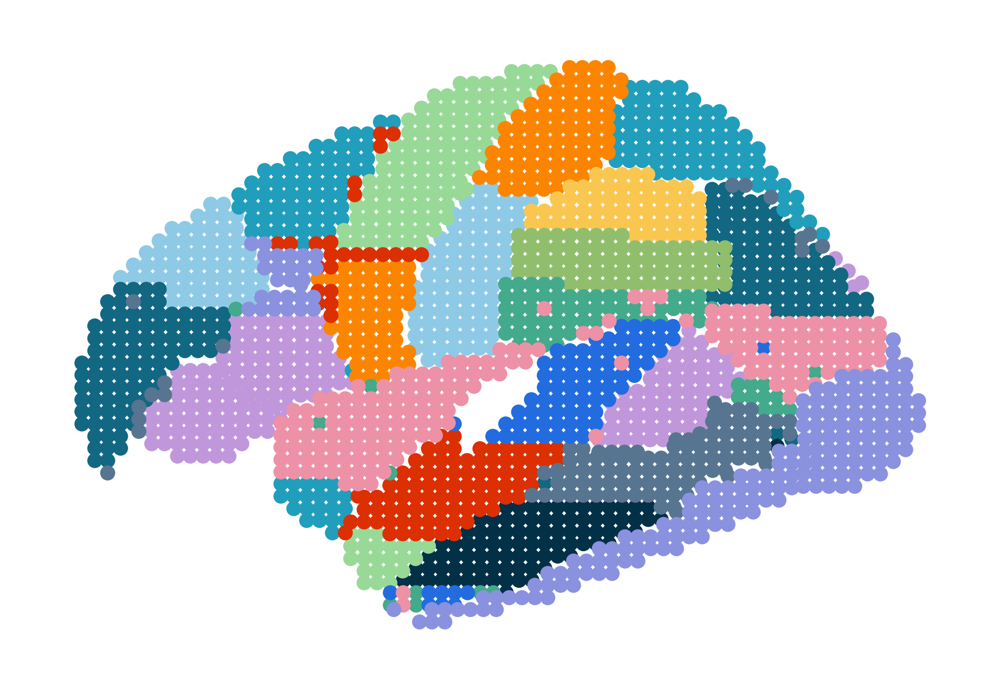

In [30]:
adata_cluster = utils_simu.plot_latent_cluster(adata_model_gener,
                               res  = 1.,
                               size =3,
color_list = [
'#8ecae6',
'#c197db',
'#126782',
'#023047',
'#219ebc',                                   
'#98d998',
'#fb8500',
'#dc2f02',                         
'#f9c74f',
'#90be6d',
'#43aa8b',
'#577590',  
'#226CE0',
'#ed91a6',
'#8a91de'
],
                               figsize=(3,2),                
                               use_rep = 'coral',
                               legd =False,
                               return_ = True,
                                invert_yaxis=False
                              )

In [31]:
def reindex_adata_qz(adata: anndata.AnnData, adata_qz: anndata.AnnData) -> anndata.AnnData:
    """
    Reindex adata_qz to match the order of adata based on spatial coordinates.

    Parameters:
    - adata: AnnData object containing the reference spatial coordinates.
    - adata_qz: AnnData object to be reindexed based on spatial coordinates.

    Returns:
    - adata_qz_reindexed: Reindexed AnnData object.
    """

    # Extract spatial coordinates
    spatial_coords_adata = adata.obsm['spatial']
    spatial_coords_adata_qz = adata_qz.obsm['spatial']

    # Find nearest neighbors
    tree = cKDTree(spatial_coords_adata_qz)
    distances, indices = tree.query(spatial_coords_adata)

    # Reindex adata_qz
    adata_qz_reindexed = adata_qz[indices].copy()
    adata_qz_reindexed.obs.index = adata.obs.index

    return adata_qz_reindexed
adata_model_gener_reindexed = reindex_adata_qz(codex_adata, adata_model_gener)
#

In [189]:
codex_adata

AnnData object with n_obs × n_vars = 1992 × 6
    obs: 'x', 'y', 'label', 'cell_type'
    obsm: 'spatial'

In [33]:
adata_model_gener_reindexed

AnnData object with n_obs × n_vars = 1992 × 6
    obs: 'leiden', 'cluster'
    uns: 'neighbors', 'leiden'
    obsm: 'generated_expr', 'coral', 'spatial', 'visium_true', 'codex_true', 'v_values', 'cell_types'
    obsp: 'distances', 'connectivities'

In [34]:
adata_model_gener_reindexed.write('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/fig3/coral_fig3.h5ad')


In [35]:
generated_expr.shape

(1992, 106)

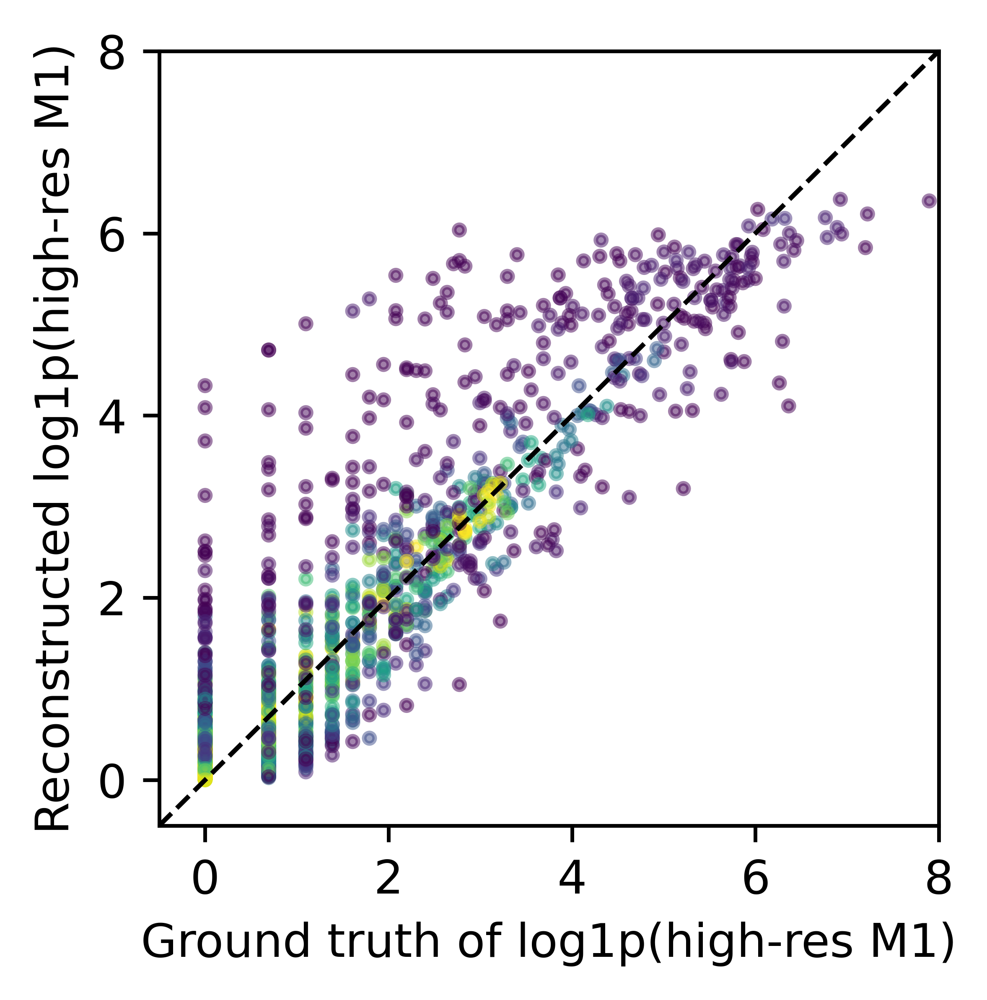

In [36]:
generated_adata = anndata.AnnData(generated_expr)
generated_adata.obsm['latent_rep'] = latent_rep
generated_adata.obsm['spatial'] = locations

utils.display_reconst(
                pd.DataFrame((np.log1p(visium_true))),
                pd.DataFrame((np.log1p(generated_expr))),
                density=True,
                x_label='Ground truth of log1p(high-res M1)',
                y_label='Reconstructed log1p(high-res M1)',
                spot_size=5,
                size=(3,3),
                min_val=-0.5,
                max_val=8,
               )

In [37]:
from scipy import stats
stats.pearsonr(
            (np.array(visium_true)).flatten(),
            (np.array(generated_expr)).flatten(),
           )


PearsonRResult(statistic=0.7837390124449559, pvalue=0.0)

In [38]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_sim = cosine_similarity(
    (np.array(visium_true)).flatten().reshape(1, -1),
    (np.array(generated_expr)).flatten().reshape(1, -1)
)[0][0]
print(f"Cosine Similarity: {cosine_sim}")

Cosine Similarity: 0.7934755682945251


In [39]:
len(generated_expr.mean(axis=0))

106

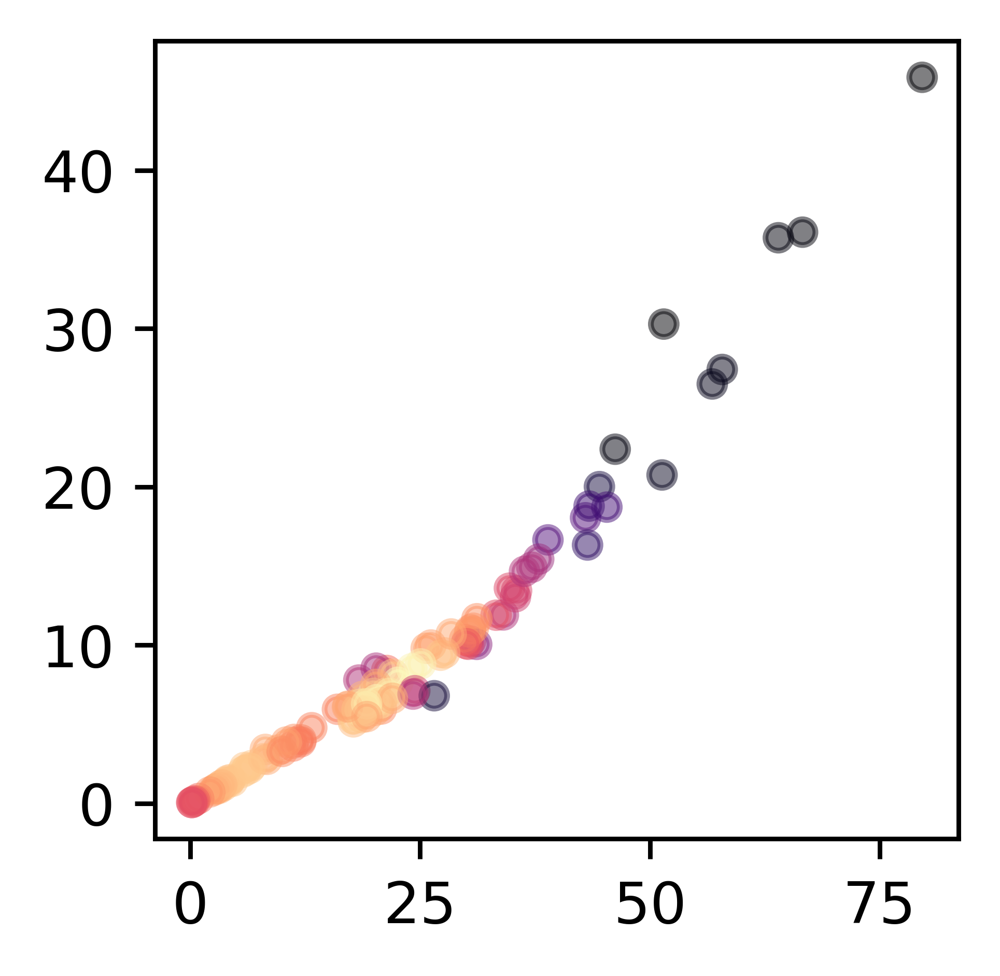

In [40]:
from scipy.stats import gaussian_kde
df_true_sample = pd.DataFrame(generated_expr.mean(axis=0))
df_pred_sample = pd.DataFrame(visium_adata.X.mean(axis=0))

plt.figure(figsize=(2.5,2.5),dpi=800)
ax = plt.gca()

xx = df_true_sample.T.to_numpy().flatten()
yy = df_pred_sample.T.to_numpy().flatten()


for gene in df_true_sample.columns:
    try:
        gene_true = df_true_sample[gene].values
        gene_pred = df_pred_sample[gene].values
        gexp_stacked = np.vstack([df_true_sample[gene].values, df_pred_sample[gene].values])

        z = gaussian_kde(gexp_stacked)(gexp_stacked)
        ax.scatter(gene_true, gene_pred, c=z, s=20, alpha=0.5,cmap='magma')
    except np.linalg.LinAlgError as e:
        pass

In [41]:
from scipy import stats
stats.pearsonr(
            (generated_expr.mean(axis=0)).flatten(),
            (visium_adata.X.mean(axis=0)).flatten(),
           )



PearsonRResult(statistic=0.9666984943508075, pvalue=2.2350526639713057e-63)

In [42]:
cosine_sim = cosine_similarity(
    np.array(generated_expr.mean(axis=0)).flatten().reshape(1, -1),
    np.array(visium_adata.X.mean(axis=0)).flatten().reshape(1, -1)
)[0][0]
print(f"Cosine Similarity: {cosine_sim}")

Cosine Similarity: 0.9782055939398414


In [46]:
sc.tl.umap(codex_adata_copy,min_dist=0.1) 

(-1.8809761464595796, 14.9917917907238, 4.421867775917053, 12.65051085948944)

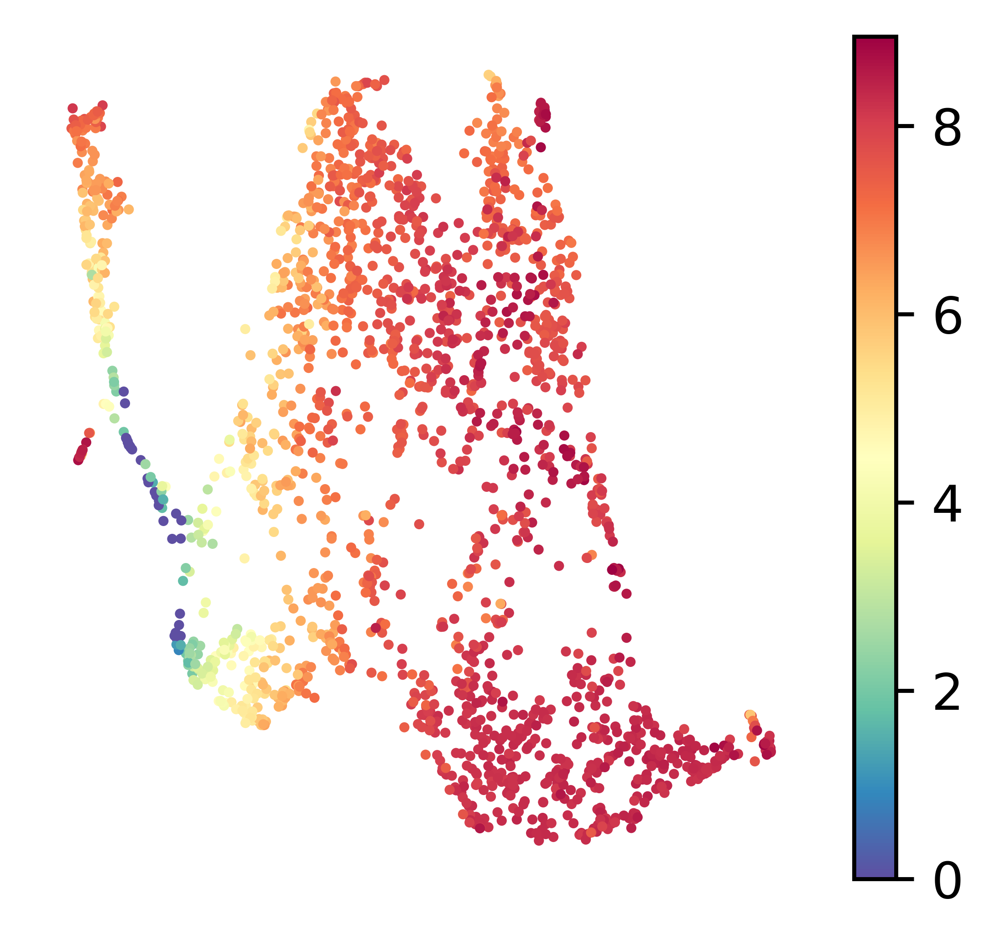

In [47]:
fig, ax = plt.subplots(1,1,figsize=(3.4,3),dpi=800)
g = plt.scatter(codex_adata_copy.obsm['X_umap'][:,0],
                codex_adata_copy.obsm['X_umap'][:,1],
                s=1,
                c = codex_adata_copy[:,'ADT_CD4'].to_df().values,
                cmap = 'Spectral_r',
                #vmin=2,
                #vmax=7.8
               )
plt.colorbar(g)
plt.axis('off') 
#plt.yticks([])

Text(0, 0.5, '')

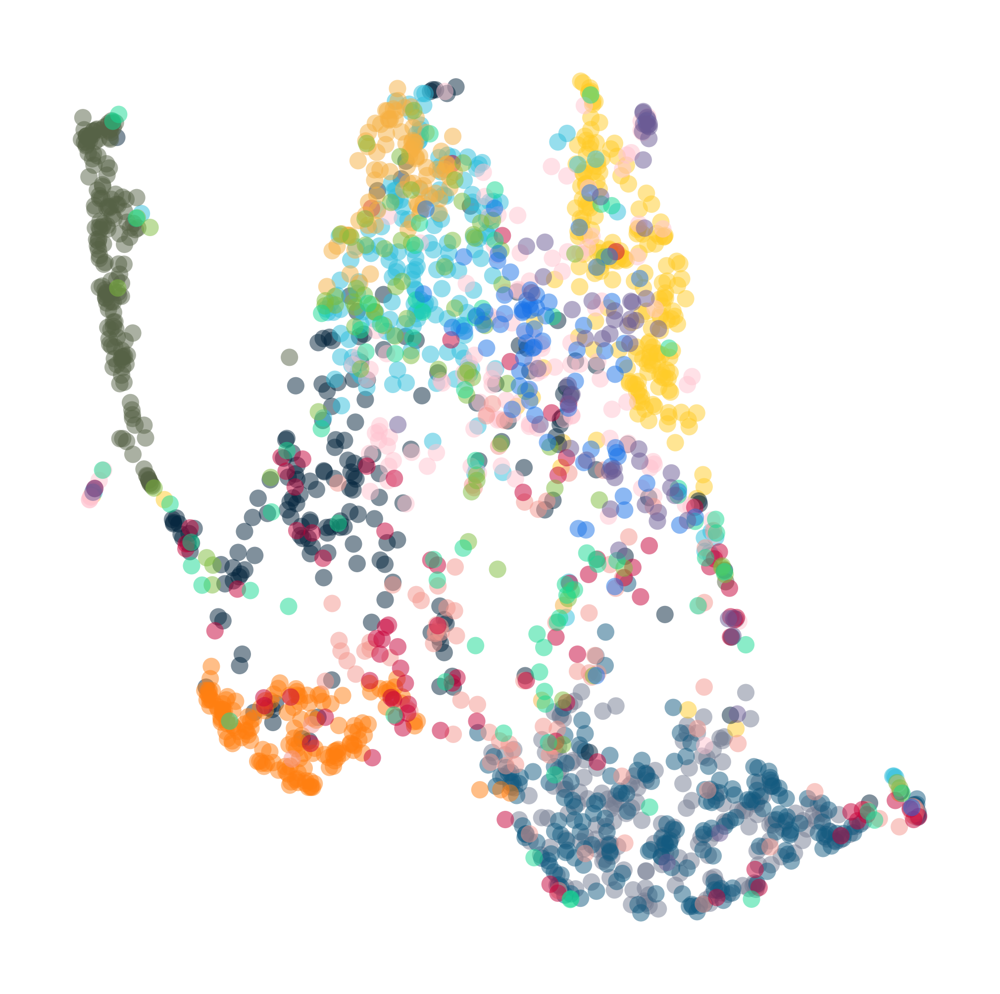

In [51]:

color_list = [
    '#747C92',  # Light Blue
    '#ffcc29',  # Bright Yellow
    '#125a80',  # Deep Teal
    '#02233b',  # Dark Navy
    '#2ebedc',  # Bright Cyan
    '#566246',  # Fresh Green
    '#ff7f11',  # Vibrant Orange
    '#FFC4D1',  # Dark Crimson
    '#f4978e',  # Soft Coral
    '#c70039',  # Vivid Red
    '#f6b042',  # Golden Yellow
    '#7ebd3c',  # Spring Green
    '#16db93',  # Aquamarine Green
    '#1a73e8',  # Bold Blue
    '#6b5b95',  # Dusty Purple
    '#3f3d56'   # Charcoal Gray
]


fig, ax = plt.subplots(1,1,figsize=(3,3),dpi=800)
for j,i in enumerate(adata_model_gener_reindexed.obs['ground_type'].unique()):
    plt.scatter(codex_adata_copy.obsm['X_umap'][adata_model_gener_reindexed.obs['ground_type']==i,0],
                codex_adata_copy.obsm['X_umap'][adata_model_gener_reindexed.obs['ground_type']==i,1],
                s=10,
                edgecolor='none',
                color = color_list[j],
                alpha = 0.5,
               )
#plt.legend(adata_model_gener_reindexed.obs['ground_type'].unique(),bbox_to_anchor=(1.01,0.8))
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.xlabel('')
plt.ylabel('')

In [53]:
concat_ =anndata.AnnData(np.concatenate([adata_model_gener_reindexed.obsm['generated_expr']],axis=1))
sc.pp.normalize_total(concat_)
sc.pp.log1p(concat_)
sc.pp.pca(concat_)
sc.pp.neighbors(concat_,n_neighbors=30)
sc.tl.umap(concat_,min_dist=1)
sc.tl.leiden(concat_,resolution=0.4)

adata_model_gener_reindexed.obsm['sc_inte_umap'] = concat_.obsm['X_umap']
adata_model_gener_reindexed.obs['sc_leiden'] =  np.array(concat_.obs['leiden'])
adata_model_gener_reindexed.obs['ground_type'] = visium_adata.obs['cell_type']


Memory CD4 T
CD14+ Mono
Naive CD4 T
NK
Mouse
B
CD8 T
CD16+ Mono
T/Mono doublets
CD34+
Multiplets
Eryth
Mk
DC
pDCs


Text(0, 0.5, '')

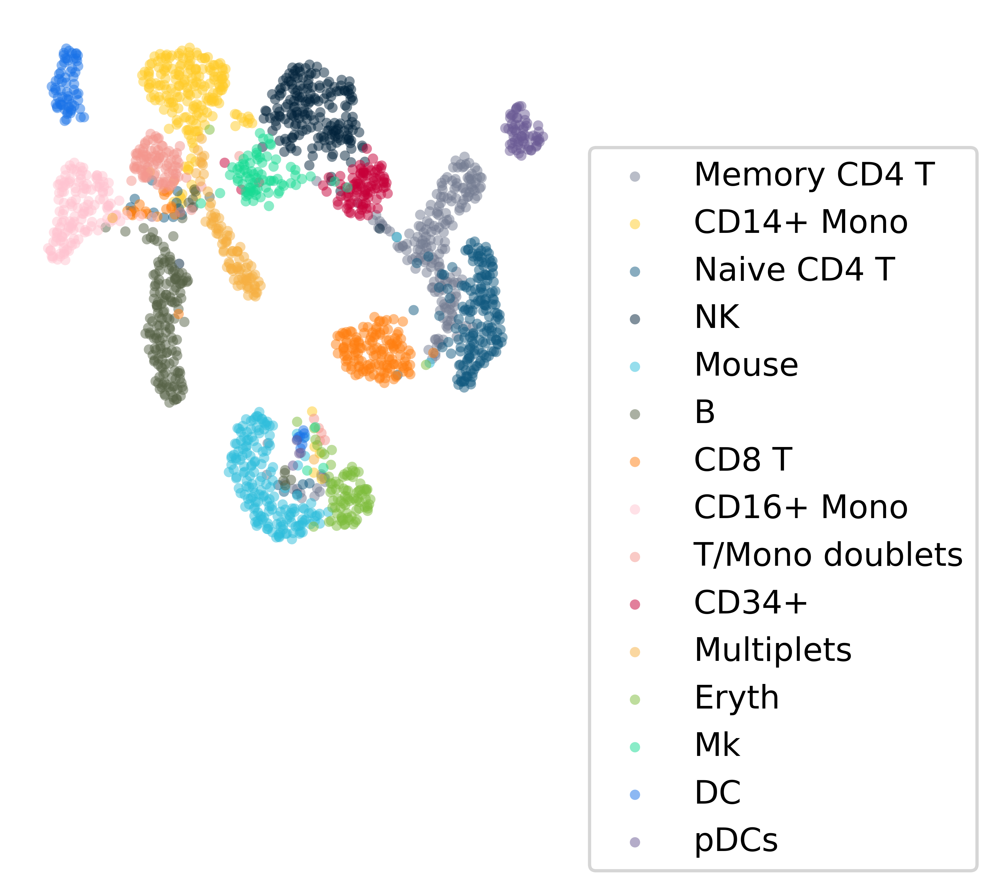

In [81]:
color_list = [
    '#747C92',  # Light Blue
    '#ffcc29',  # Bright Yellow
    '#125a80',  # Deep Teal
    '#02233b',  # Dark Navy
    '#2ebedc',  # Bright Cyan
    '#566246',  # Fresh Green
    '#ff7f11',  # Vibrant Orange
    '#FFC4D1',  # Dark Crimson
    '#f4978e',  # Soft Coral
    '#c70039',  # Vivid Red
    '#f6b042',  # Golden Yellow
    '#7ebd3c',  # Spring Green
    '#16db93',  # Aquamarine Green
    '#1a73e8',  # Bold Blue
    '#6b5b95',  # Dusty Purple
    '#3f3d56'   # Charcoal Gray
]
plt.subplots(1,1,figsize= (3,3),dpi=800)
for j,i in enumerate(adata_model_gener_reindexed.obs['ground_type'].unique()):
    print(i)
    plt.scatter(adata_model_gener_reindexed.obsm['sc_inte_umap'][adata_model_gener_reindexed.obs['ground_type']==i,0],
                adata_model_gener_reindexed.obsm['sc_inte_umap'][adata_model_gener_reindexed.obs['ground_type']==i,1],
                s=10,
                alpha = 0.5,
                edgecolor='none',
                color = color_list[j]
               )
plt.legend(adata_model_gener_reindexed.obs['ground_type'].unique(),bbox_to_anchor=(1.01,0.8))
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.xlabel('')
plt.ylabel('')

In [58]:
adata_model_gener_reindexed.write('/hpc/mydata/siyu.he/Siyu_projects/coral_storage/coral_results/fig3/coral_fig3_output_data.h5ad')

Memory CD4 T
CD14+ Mono
Naive CD4 T
NK
Mouse
B
CD8 T
CD16+ Mono
T/Mono doublets
CD34+
Multiplets
Eryth
Mk
DC
pDCs


Text(0, 0.5, '')

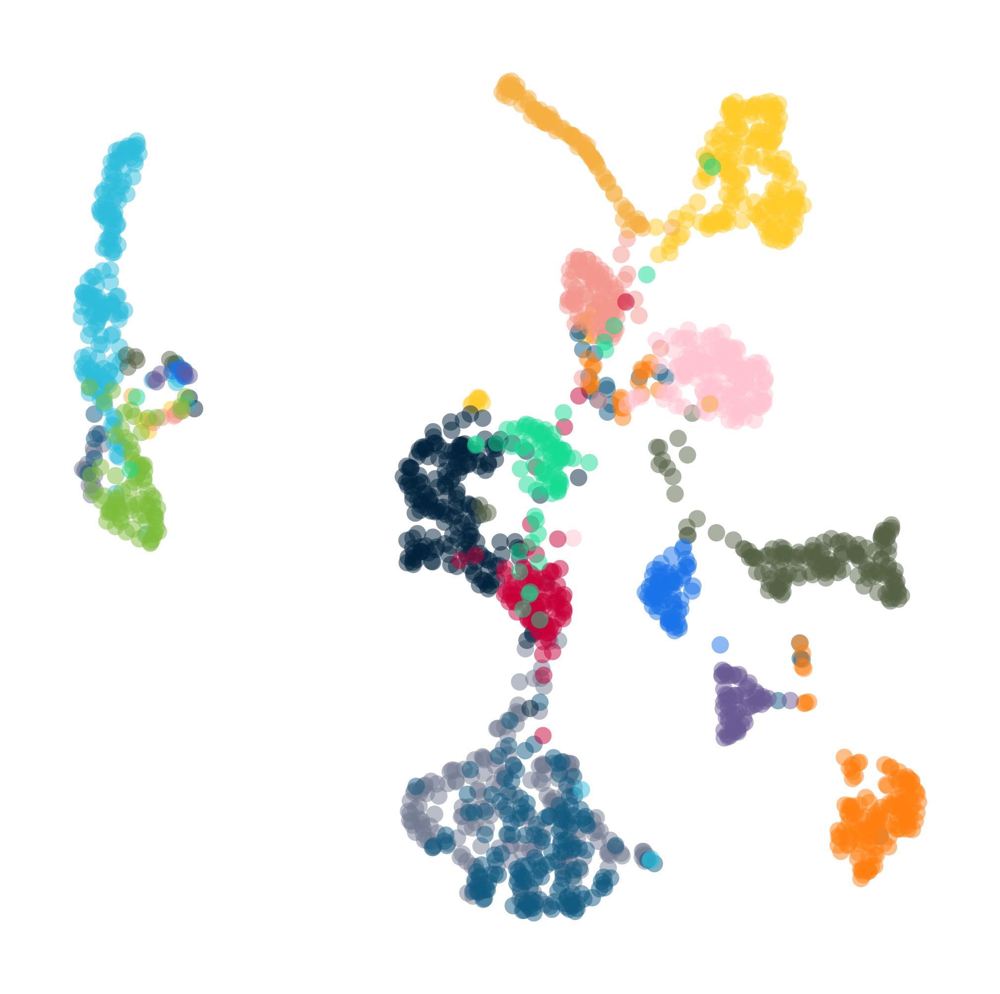

In [228]:

plt.subplots(1,1,figsize= (3,3),dpi=800)
for j,i in enumerate(adata_model_gener_reindexed.obs['ground_type'].unique()):
    print(i)
    plt.scatter(adata_model_gener_reindexed.obsm['sc_inte_umap'][adata_model_gener_reindexed.obs['ground_type']==i,0],
                adata_model_gener_reindexed.obsm['sc_inte_umap'][adata_model_gener_reindexed.obs['ground_type']==i,1],
                s=10,
                alpha = 0.5,
                edgecolor='none',
                color = color_list[j]
               )
#plt.legend(adata_model_gener_reindexed.obs['ground_type'].unique(),bbox_to_anchor=(1.01,0.8))
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.xlabel('')
plt.ylabel('')

0
1
10
11
12
13
14
2
3
4
5
6
7
8
9


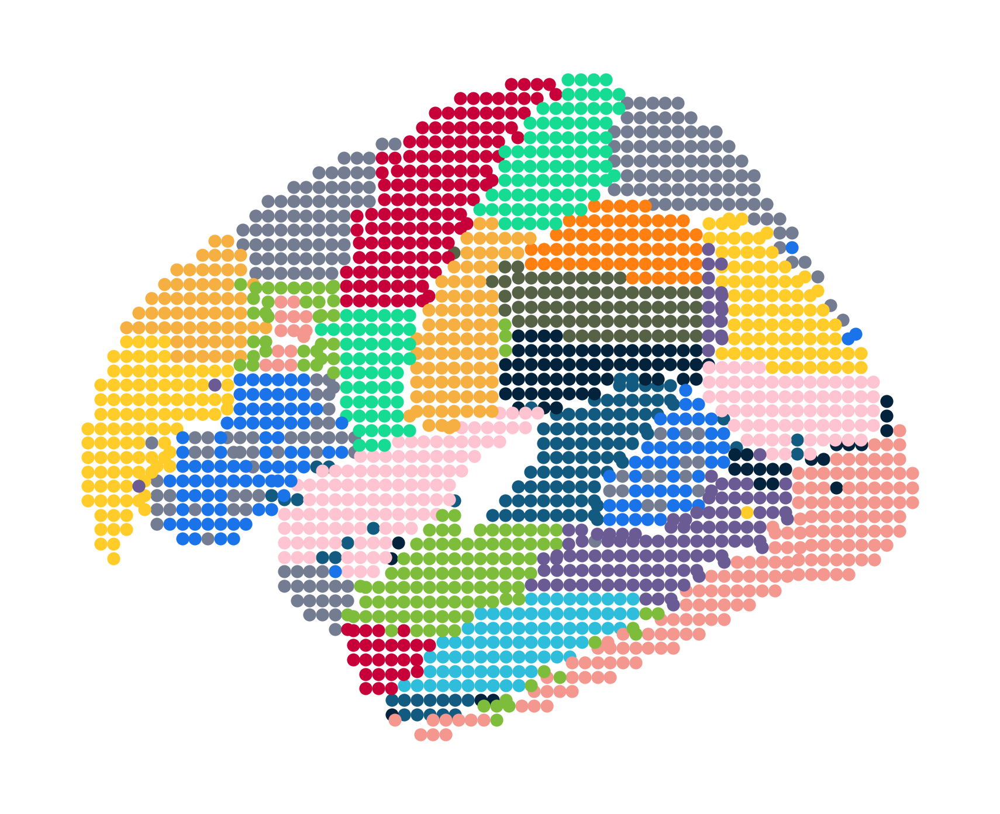

In [59]:
fig, ax = plt.subplots(1,1,figsize=(2.5,2),dpi=800)
for j,i in enumerate(sorted(adata_model_gener_reindexed.obs['sc_leiden'].unique())):
    print(i)
    plt.scatter(adata_model_gener_reindexed.obsm['spatial'][adata_model_gener_reindexed.obs['sc_leiden']==i,0],
                -adata_model_gener_reindexed.obsm['spatial'][adata_model_gener_reindexed.obs['sc_leiden']==i,1],
                s=1,
                color = color_list[j]
               )
#plt.legend(sorted(adata_cluster.obs['cluster'].unique()),bbox_to_anchor=(1.01,0.8))
plt.axis('off') 
plt.gca().invert_yaxis()

In [61]:
'Pecam1' in visium_adata.to_df().columns

False

In [66]:
concat_.var_names = visium_adata.var_names

In [68]:
concat_.var_names

Index(['LYZ', 'S100A8', 'S100A9', 'TYROBP', 'GNLY', 'CST3', 'HLA-DRA',
       'S100A4', 'MOUSE-mt-Nd1', 'MOUSE-mt-Cytb',
       ...
       'MOUSE-Gnb2l1', 'MOUSE-Slc25a4', 'MOUSE-H3f3b', 'MOUSE-Hint1', 'CD14',
       'CD3E', 'CD8A', 'CD4', 'CD19', 'CD34'],
      dtype='object', length=106)

Text(0, 0.5, '')

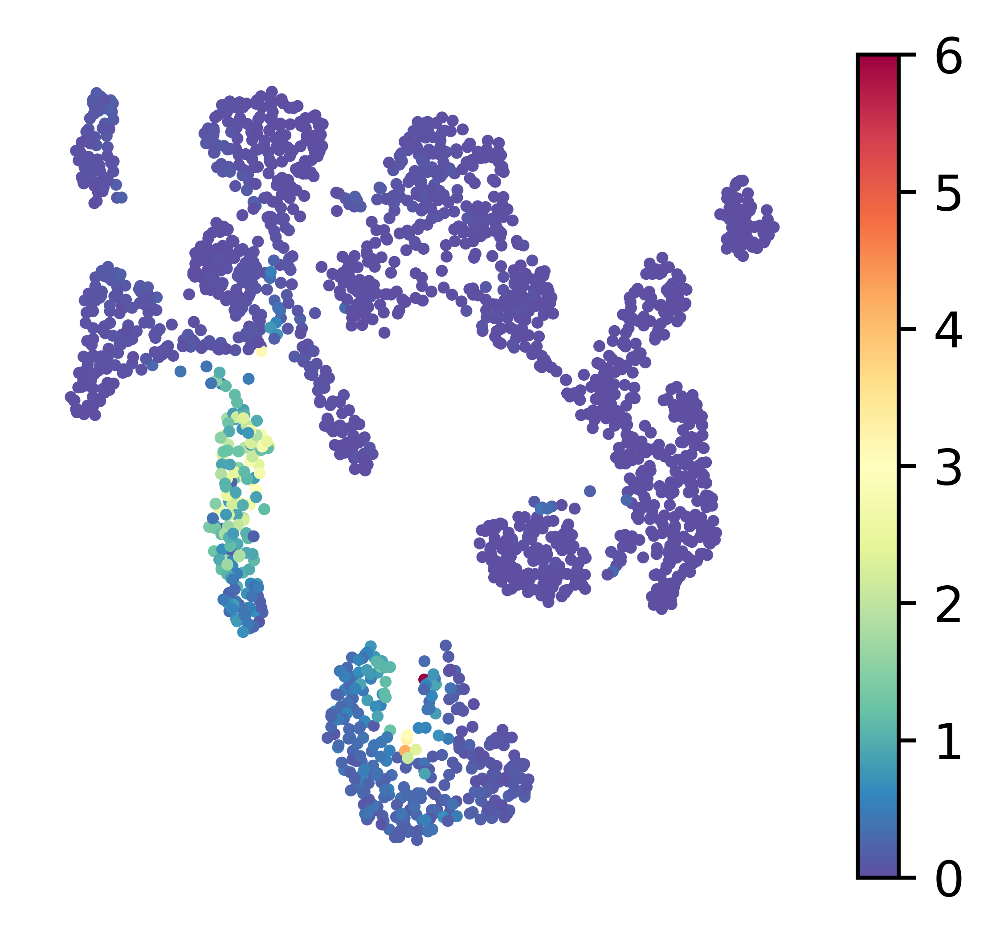

In [87]:
plt.subplots(1,1,figsize= (3.5,3),dpi=800)
g = plt.scatter(adata_model_gener_reindexed.obsm['sc_inte_umap'][:,0],
            adata_model_gener_reindexed.obsm['sc_inte_umap'][:,1],
            s=2,
            alpha = 1,
                cmap='Spectral_r',
            c = generated_expr_adata[:,'CD19'].to_df().values,
                vmin=0,
                vmax=6
           )
plt.colorbar(g)
#plt.legend(adata_model_gener_reindexed.obs['sc_leiden'].unique(),bbox_to_anchor=(1.01,0.8))
plt.xticks([])

plt.yticks([])
plt.axis('off')
plt.xlabel('')
plt.ylabel('')

In [141]:
adata_model_gener_reindexed

AnnData object with n_obs × n_vars = 4697 × 51
    obs: 'leiden', 'cluster', 'sc_leiden'
    uns: 'neighbors', 'leiden'
    obsm: 'generated_expr', 'coral', 'spatial', 'visium_true', 'codex_true', 'v_values', 'cell_types', 'sc_inte_umap'
    obsp: 'distances', 'connectivities'

In [97]:
coral_umap = anndata.AnnData(adata_model_gener_reindexed.obsm['generated_expr'])
#sc.pp.normalize_total(generated_expr_adata)
#sc.pp.log1p(generated_expr_adata)
sc.pp.pca(coral_umap)
sc.pp.neighbors(coral_umap,n_neighbors=30)
sc.tl.umap(coral_umap,min_dist=0.8)




from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import numpy as np

# PCA coordinates and annotations
pca_coords_codex = codex_adata_copy.obsm['X_pca']
pca_coords_generated = coral_umap.obsm['X_pca']

annotations = adata_model_gener_reindexed.obs['ground_type'].values


In [98]:
import numpy as np
from sklearn.metrics import silhouette_score

# Function for intra-to-inter-cluster distance ratio
def intra_inter_distance_ratio(data, labels):
    intra_distances = []
    inter_distances = []
    unique_labels = np.unique(labels)

    for label in unique_labels:
        # Points in current cluster
        points_in_cluster = data[labels == label]
        
        # Calculate intra-cluster distance
        intra_cluster_distance = np.mean([
            np.linalg.norm(p1 - p2) 
            for i, p1 in enumerate(points_in_cluster) 
            for p2 in points_in_cluster[i+1:]
        ])
        intra_distances.append(intra_cluster_distance)
        
        # Calculate inter-cluster distance
        points_outside_cluster = data[labels != label]
        inter_cluster_distance = np.mean([
            np.linalg.norm(p1 - p2)
            for p1 in points_in_cluster
            for p2 in points_outside_cluster
        ])
        inter_distances.append(inter_cluster_distance)
    
    # Ratio of mean inter-cluster to mean intra-cluster distances
    return np.mean(inter_distances) / np.mean(intra_distances)

# Calculate metrics
pca_datasets = {
    "truncated_codex": pca_coords_codex,
    "generated_expr_adata": pca_coords_generated
}

silhouette_scores = []
intra_inter_ratios = []

for name, data in pca_datasets.items():
    # Silhouette Score
    silhouette = silhouette_score(data, annotations)
    silhouette_scores.append(silhouette)
    
    # Intra-to-Inter-Cluster Distance Ratio
    intra_inter_ratio = intra_inter_distance_ratio(data, annotations)
    intra_inter_ratios.append(intra_inter_ratio)



/tmp/ipykernel_783045/3710462118.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(dataset_names, rotation=45)


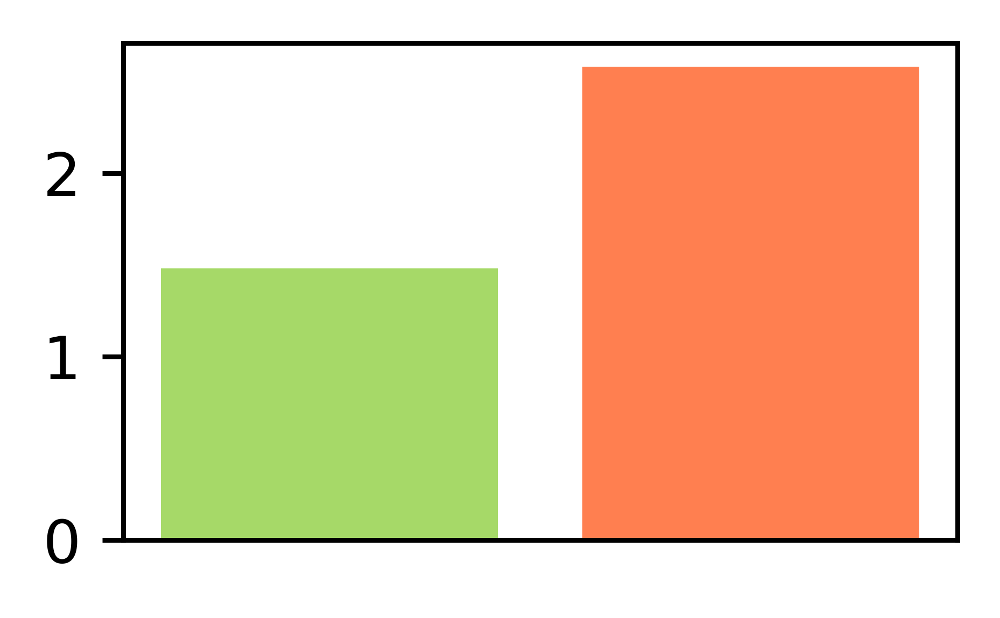

In [99]:
# Plot bar chart with specified colors
fig, ax = plt.subplots(1, 1, figsize=(2.5, 1.5), dpi=800)
dataset_names = list(pca_datasets.keys())

# Updated color list for bars
bar_color = ['#a6d968', '#ffdacc', '#ffa887', '#ff9b76', '#FF7F50']
bar_color = ['#a6d968', '#FF7F50']

# Intra-to-Inter-Cluster Distance Ratio Bar Plot
ax.bar(dataset_names, intra_inter_ratios, color=bar_color)
ax.set_ylabel('Intra-to-Inter-Cluster Ratio')
ax.set_xticklabels(dataset_names, rotation=45)
plt.xticks(rotation=45)  # Adjusted for visibility instead of removing xticks
#plt.tight_layout()
plt.ylabel('')
plt.xticks([])
plt.show()

In [101]:
import numpy as np
from sklearn.metrics import pairwise_distances
from sklearn.neighbors import NearestNeighbors


k = 5

def calculate_jaccard_similarity(UMAP1, UMAP2, k):
    n_cells = UMAP1.shape[0]
    
    # Calculate nearest neighbors for UMAP1
    nbrs1 = NearestNeighbors(n_neighbors=k+1, algorithm='ball_tree').fit(UMAP1)
    distances1, indices1 = nbrs1.kneighbors(UMAP1)
    
    # Calculate nearest neighbors for UMAP2
    nbrs2 = NearestNeighbors(n_neighbors=k+1, algorithm='ball_tree').fit(UMAP2)
    distances2, indices2 = nbrs2.kneighbors(UMAP2)
    
    # Initialize list to store Jaccard similarity for each cell
    jaccard_similarities = []
    
    for i in range(n_cells):
        # Get the sets of nearest neighbors (excluding the cell itself)
        neighbors_1 = set(indices1[i][1:])  # Exclude the cell itself at index 0
        neighbors_2 = set(indices2[i][1:])
        
        # Calculate Jaccard similarity
        intersection = len(neighbors_1.intersection(neighbors_2))
        union = len(neighbors_1.union(neighbors_2))
        jaccard_index = intersection / union if union > 0 else 0
        
        jaccard_similarities.append(jaccard_index)
    
    # Calculate the average Jaccard Similarity Index across all cells
    average_jaccard_similarity = np.mean(jaccard_similarities)
    
    return average_jaccard_similarity, jaccard_similarities

# Example usage
average_jaccard, jaccard_similarities = calculate_jaccard_similarity(pca_coords_codex, annotations, k)

print("Average Jaccard Similarity Index:", average_jaccard)

average_jaccard, jaccard_similarities = calculate_jaccard_similarity(pca_coords_generated, annotations, k)

print("Average Jaccard Similarity Index:", average_jaccard)



ValueError: Expected a 2-dimensional container but got <class 'pandas.core.arrays.categorical.Categorical'> instead. Pass a DataFrame containing a single row (i.e. single sample) or a single column (i.e. single feature) instead.

/tmp/ipykernel_783045/4158114464.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(dataset_names, rotation=45)


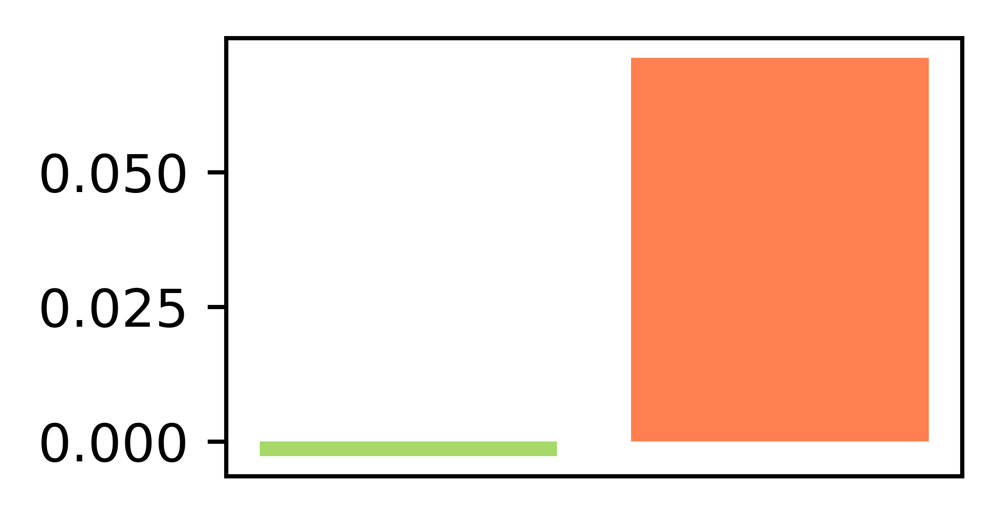

In [96]:
# Plot bar chart with specified colors
fig, ax = plt.subplots(1, 1, figsize=(2.5, 1.5), dpi=800)
dataset_names = list(pca_datasets.keys())

# Updated color list for bars
bar_color = ['#a6d968', '#ffdacc', '#ffa887', '#ff9b76', '#FF7F50']
bar_color = ['#a6d968', '#FF7F50']

# Intra-to-Inter-Cluster Distance Ratio Bar Plot
ax.bar(dataset_names, silhouette_scores, color=bar_color)
ax.set_ylabel('Intra-to-Inter-Cluster Ratio')
ax.set_xticklabels(dataset_names, rotation=45)
plt.xticks(rotation=45)  # Adjusted for visibility instead of removing xticks
#plt.tight_layout()
plt.ylabel('')
plt.xticks([])
plt.show()

In [102]:
import numpy as np
from sklearn.metrics import silhouette_score

# Function for intra-to-inter-cluster distance ratio
def intra_inter_distance_ratio(data, labels):
    intra_distances = []
    inter_distances = []
    unique_labels = np.unique(labels)

    for label in unique_labels:
        # Points in current cluster
        points_in_cluster = data[labels == label]
        
        # Calculate intra-cluster distance
        intra_cluster_distance = np.mean([
            np.linalg.norm(p1 - p2) 
            for i, p1 in enumerate(points_in_cluster) 
            for p2 in points_in_cluster[i+1:]
        ])
        intra_distances.append(intra_cluster_distance)
        
        # Calculate inter-cluster distance
        points_outside_cluster = data[labels != label]
        inter_cluster_distance = np.mean([
            np.linalg.norm(p1 - p2)
            for p1 in points_in_cluster
            for p2 in points_outside_cluster
        ])
        inter_distances.append(inter_cluster_distance)
    
    # Ratio of mean inter-cluster to mean intra-cluster distances
    return np.mean(inter_distances) / np.mean(intra_distances)

# Bootstrapping function for error calculation
def bootstrap_metric(data, labels, metric_func, n_bootstrap=100):
    scores = []
    n_samples = len(data)
    for _ in range(n_bootstrap):
        # Randomly sample with replacement
        indices = np.random.choice(n_samples, n_samples, replace=True)
        sampled_data = data[indices]
        sampled_labels = labels[indices]
        
        # Calculate metric on bootstrap sample
        score = metric_func(sampled_data, sampled_labels)
        scores.append(score)
    
    # Calculate mean and standard deviation for error bars
    mean_score = np.mean(scores)
    std_error = np.std(scores)
    return mean_score, std_error

# Calculate metrics with bootstrapping
pca_datasets = {
    "truncated_codex": pca_coords_codex,
    "generated_expr_adata": pca_coords_generated
}

silhouette_results = {}
intra_inter_results = {}

for name, data in pca_datasets.items():
    # Silhouette Score with bootstrapping
    silhouette_mean, silhouette_error = bootstrap_metric(
        data, annotations, silhouette_score
    )
    silhouette_results[name] = (silhouette_mean, silhouette_error)
    
    # Intra-to-Inter-Cluster Distance Ratio with bootstrapping
    intra_inter_mean, intra_inter_error = bootstrap_metric(
        data, annotations, intra_inter_distance_ratio
    )
    intra_inter_results[name] = (intra_inter_mean, intra_inter_error)

# Print results with error bars
print("Silhouette Scores with Error Bars:")
for name, (mean, error) in silhouette_results.items():
    print(f"{name}: {mean:.3f} ± {error:.3f}")

print("\nIntra-to-Inter-Cluster Distance Ratios with Error Bars:")
for name, (mean, error) in intra_inter_results.items():
    print(f"{name}: {mean:.3f} ± {error:.3f}")


Silhouette Scores with Error Bars:
truncated_codex: -0.029 ± 0.010
generated_expr_adata: -0.038 ± 0.023

Intra-to-Inter-Cluster Distance Ratios with Error Bars:
truncated_codex: 1.495 ± 0.017
generated_expr_adata: 2.604 ± 0.110
